In [64]:
import numpy as np
from functions import *
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
import pickle

In [65]:
with open("plot_data.pkl", "rb+") as file:
        params, curves_de, curves_es_mu, calls_de, calls_es_mu, best_points_de, best_points_es_mu = pickle.load(file)

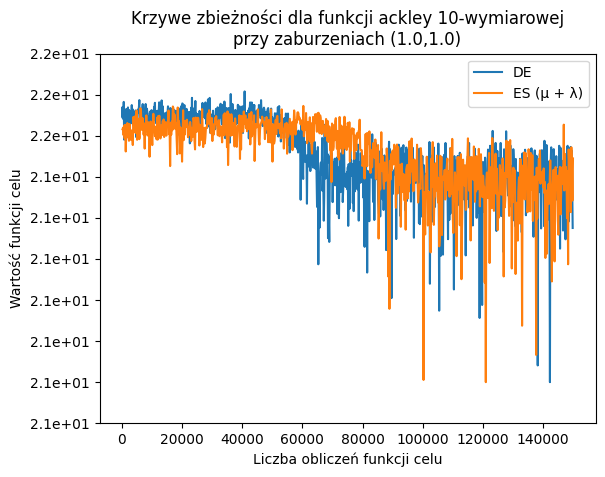

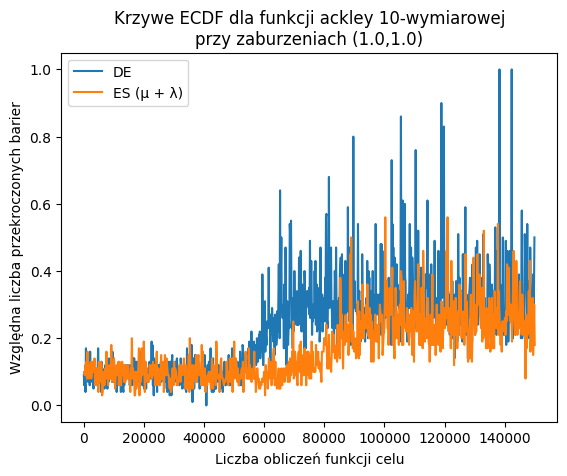

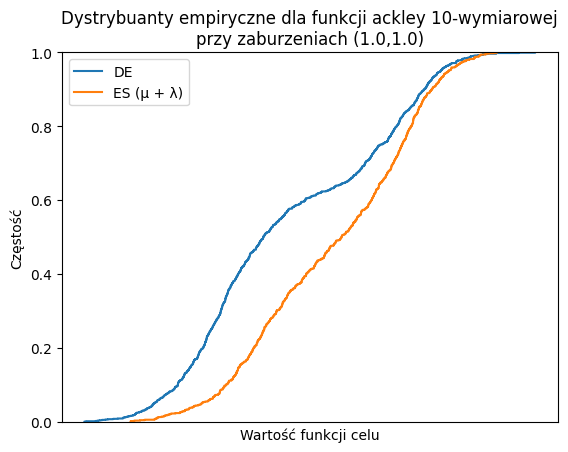

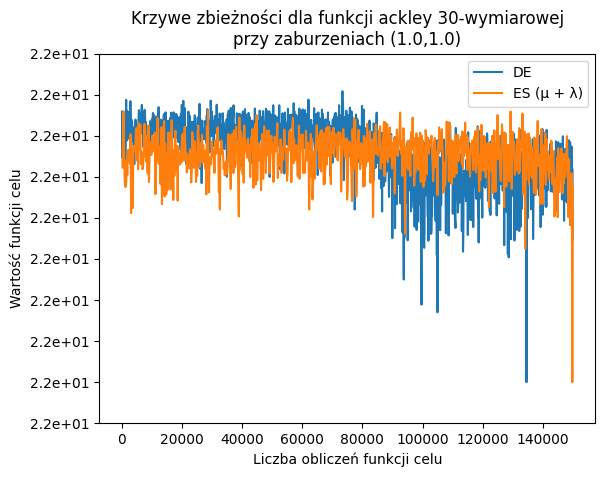

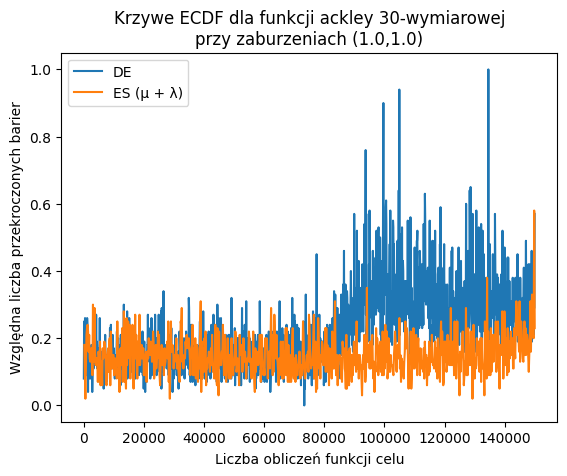

...

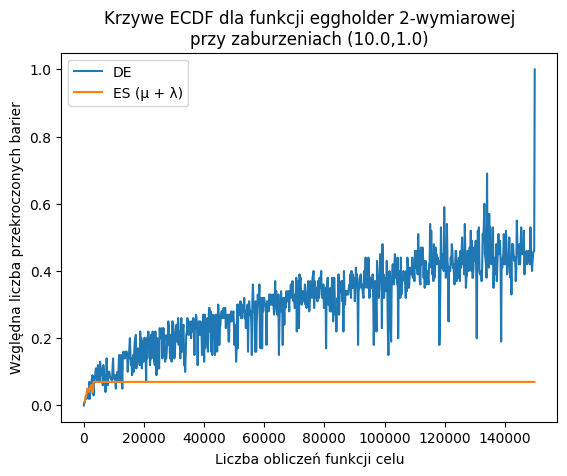

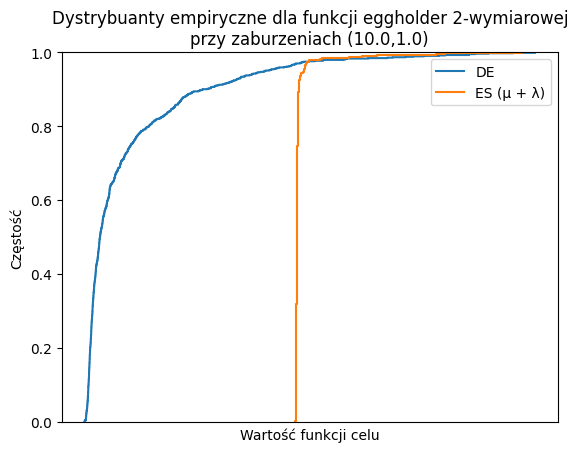

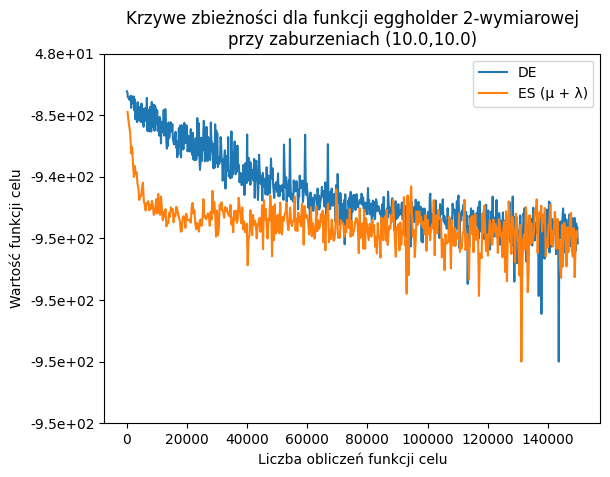

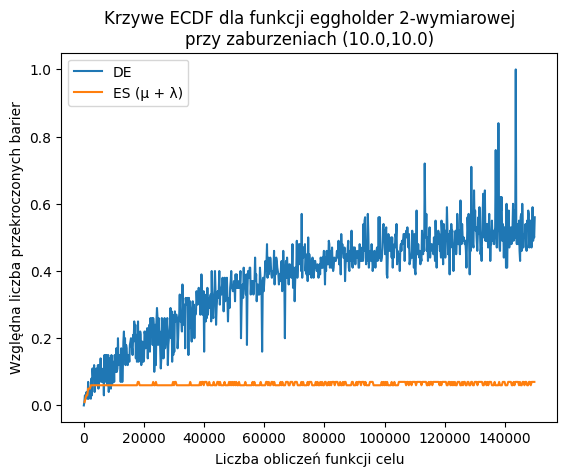

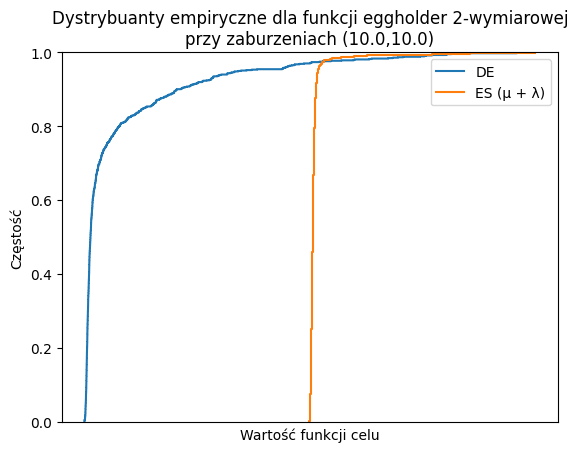

<Figure size 640x480 with 0 Axes>

In [66]:
eps = 1e-2

for i, param in enumerate(params):
    max_both = max(max(curves_de[i]), max(curves_es_mu[i]))
    min_both = min(min(curves_de[i]), min(curves_es_mu[i]))

    plt.plot(calls_de[i], np.log10(curves_de[i] - min(curves_de[i]) + eps))
    plt.plot(calls_es_mu[i], np.log10(curves_es_mu[i] - min(curves_es_mu[i]) + eps))
    yticks = plt.yticks()[0]
    ylabels = np.power(10, yticks) + min_both - eps
    ylabels = [f"{label:.1e}" for label in ylabels]
    plt.yticks(yticks, ylabels)
    plt.title(
        f"Krzywe zbieżności dla funkcji {param[0].__name__} {param[3]}-wymiarowej\n" +
        f"przy zaburzeniach ({param[1]},{param[2]})")
    plt.xlabel("Liczba obliczeń funkcji celu")
    plt.ylabel("Wartość funkcji celu")
    plt.legend(["DE", "ES (μ + λ)"])
    plt.show()
    plt.savefig(f"plots/conv_{param[0].__name__}_{param[1]}_{param[2]}_{param[3]}.png")
    plt.clf()

    barriers = np.geomspace(max_both - min_both, eps, 100) + min_both
    ecdf_de = np.array([sum(value < barriers) for value in curves_de[i]]) / len(barriers)
    ecdf_es_mu = np.array([sum(value < barriers) for value in curves_es_mu[i]]) / len(barriers)
    plt.plot(calls_de[i], ecdf_de)
    plt.plot(calls_es_mu[i], ecdf_es_mu)
    plt.title(
        f"Krzywe ECDF dla funkcji {param[0].__name__} {param[3]}-wymiarowej\n" +
        f"przy zaburzeniach ({param[1]},{param[2]})")
    plt.xlabel("Liczba obliczeń funkcji celu")
    plt.ylabel("Względna liczba przekroczonych barier")
    plt.legend(["DE", "ES (μ + λ)"])
    plt.show()
    plt.savefig(f"plots/ecdf_{param[0].__name__}_{param[1]}_{param[2]}_{param[3]}.png")
    plt.clf()

    plt.ecdf(curves_de[i])
    plt.ecdf(curves_es_mu[i])
    plt.xscale('symlog')
    plt.title(
        f"Dystrybuanty empiryczne dla funkcji {param[0].__name__} {param[3]}-wymiarowej\n" +
        f"przy zaburzeniach ({param[1]},{param[2]})")
    plt.xlabel("Wartość funkcji celu")
    plt.ylabel("Częstość")
    plt.legend(["DE", "ES (μ + λ)"])
    plt.show()
    plt.savefig(f"plots/empiric_{param[0].__name__}_{param[1]}_{param[2]}_{param[3]}.png")

In [67]:
student_comparison = [None for _ in params]

for i in range(len(params)):
    test_result = ttest_ind(best_points_de[i], best_points_es_mu[i])

    if test_result.pvalue < 0.05 or test_result.statistic == 0:
        student_comparison[i] = "none"
    elif test_result.statistic > 0:
        student_comparison[i] = "de"
    elif test_result.statistic < 0:
        student_comparison[i] = "es_mu"
            

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [ ]:
comp_11 = []
comp_110 = []
comp_101 = []
comp_1010 = []
for comp, param in zip(student_comparison, params):
    if param[1] == 1:
        if param[2] == 1:
            comp_11.append(comp)
        elif param[2] == 10:
            comp_110.append(comp)
    elif param[1] == 10:
        if param[2] == 1:
            comp_101.append(comp)
        elif param[2] == 10:
            comp_1010.append(comp)

def group_comp(comp):
    new_comp = []
    for i in range(4):
        row = [comp[3 * i], comp[3 * i + 1], comp[3 * i + 2]]
        new_comp.append(row)
    for i in range(2):
        new_comp.append(comp[i + 12])

def draw_latex_table(comp):
    comp = group_comp(comp)

    comp3d = comp[:4]
    comp1d = comp[4:]
    functions3d = ["ackley", "sphere", "poly", "disturbed_square"]
    functions1d = ["himmelblau", "eggholder"]

    print(r"\begin{tabular}{|c|c|c|c|}")
    print(r"\hline")
    print(r"Function name / Dimensions& 10& 30& 50 \\")
    for i, name in enumerate(functions3d):
        print(r"\hline")
        print(fr"{name}& {comp3d[i][0]}& {comp3d[i][1]}& {comp3d[i][2]} \\")
    print(r"\hline")
    print(r"\end{tabular} \\")

    print(r"\begin{tabular}{|c|c|}")
    print(r"\hline")
    print(r"Function name / Dimensions& 2 \\")
    for i, name in enumerate(functions1d):
        print(r"\hline")
        print(fr"{name}& {comp1d[i]} \\")
    print(r"\hline")
    print(r"\end{tabular} \\")

draw_latex_table(comp_11)
draw_latex_table(comp_101)
draw_latex_table(comp_110)
draw_latex_table(comp_1010)